# Question 1

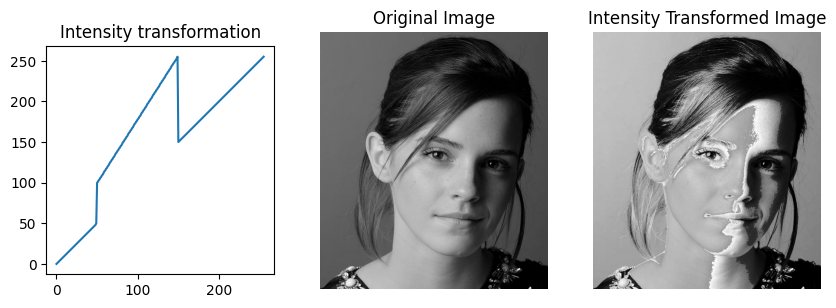

In [19]:

#Question 1
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
f = cv.imread("emma.jpg",cv.IMREAD_GRAYSCALE)
assert f is not None
t1 = np.linspace(0,50,50)
t2 = np.linspace(50,100,0)
t3 = np.linspace(100,255,100)
t4 = np.linspace(150,255,106)
t = np.concatenate((t1,t2,t3,t4),axis=0).astype(np.uint8)
assert len(t)==256
g = cv.LUT(f,t)
fig, ax = plt.subplots(1,3,figsize=(10,10))
ax[0].plot(t), ax[0].set_title("Intensity transformation"), ax[0].set_aspect('equal')
ax[1].imshow(cv.cvtColor(f,cv.COLOR_BGR2RGB)), ax[1].axis('off'), ax[1].set_title("Original Image")
ax[2].imshow(cv.cvtColor(g,cv.COLOR_BGR2RGB)), ax[2].axis('off'), ax[2].set_title("Intensity Transformed Image")
plt.show()


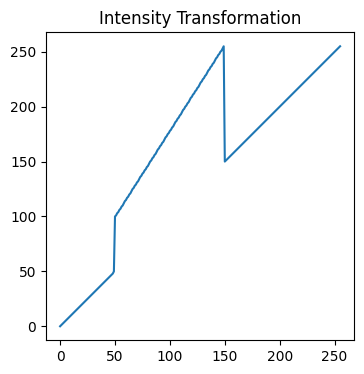

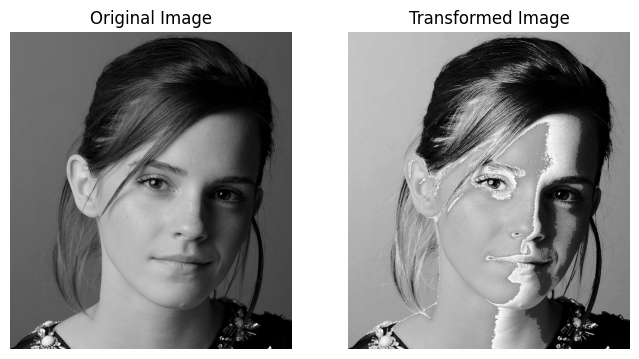

In [33]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Load the grayscale image
img = cv.imread("emma.jpg", cv.IMREAD_GRAYSCALE)
assert img is not None

# Intensity transformation functions
t1 = np.linspace(0, 50, 50)
t2 = np.linspace(50, 100, 0)
t3 = np.linspace(100, 255, 100)
t4 = np.linspace(150, 255, 106)

# Concatenate the transformations into a single array
intensity_t = np.concatenate((t1, t2, t3, t4), axis=0).astype(np.uint8)
assert len(intensity_t) == 256

# Apply the intensity transformation to the input image
transformed_img = cv.LUT(img, intensity_t)

# Create a figure for the intensity transformation plot
fig1, ax1 = plt.subplots(1, 1, figsize=(4, 4))

# Plot the intensity transformation function
ax1.plot(intensity_t)
ax1.set_title("Intensity Transformation")
ax1.set_aspect('equal')

plt.show()

# Create a figure with two subplots
fig2, ax2 = plt.subplots(1, 2, figsize=(8, 8))

# Display the original image on the first subplot
ax2[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax2[0].axis('off')
ax2[0].set_title("Original Image")

# Display the intensity transformed image on the second subplot
ax2[1].imshow(cv.cvtColor(transformed_img, cv.COLOR_BGR2RGB))
ax2[1].axis('off')
ax2[1].set_title("Transformed Image")

plt.show()


# Question 2

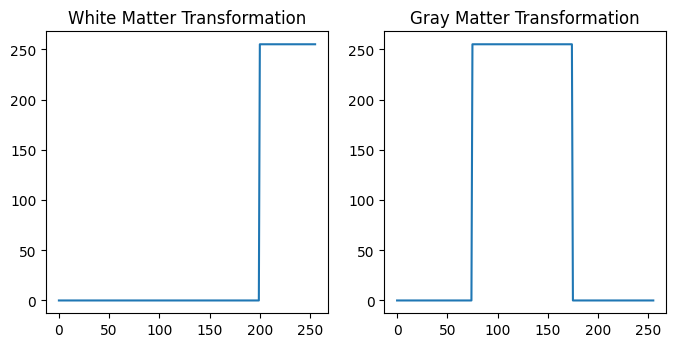

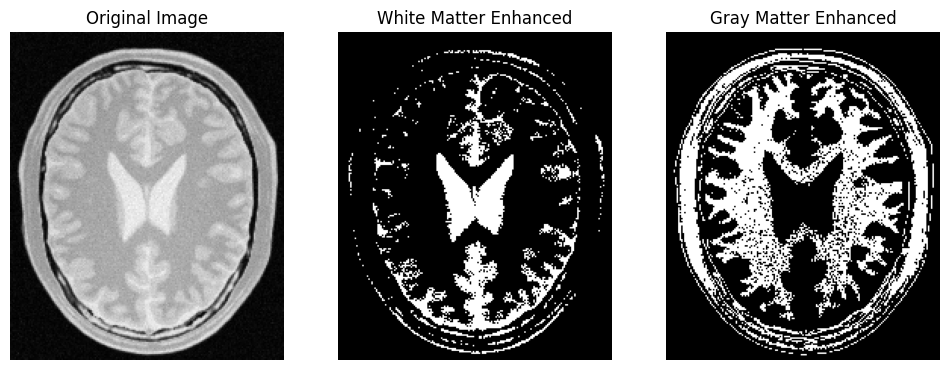

In [35]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Load the grayscale image
img = cv.imread("BrainProtonDensitySlice9.png", cv.IMREAD_GRAYSCALE)
assert img is not None

# Intensity transformation for white matter
t1 = np.zeros(200)
t2 = 255 * np.ones(56)
white_matter_transform = np.concatenate((t1, t2), axis=0).astype(np.uint8)

# Intensity transformation for gray matter
t1 = np.zeros(75)
t2 = 255 * np.ones(100)
t3 = np.zeros(81)
gray_matter_transform = np.concatenate((t1, t2, t3), axis=0).astype(np.uint8)

assert len(white_matter_transform) == 256

# Apply the intensity transformations using LUT
white_matter_enhanced = cv.LUT(img, white_matter_transform)
gray_matter_enhanced = cv.LUT(img, gray_matter_transform)

# Create a figure for the intensity transformations
fig1, ax1 = plt.subplots(1, 2, figsize=(8, 8))
ax1[0].plot(white_matter_transform)
ax1[0].set_aspect('equal')
ax1[0].set_title("White Matter Transformation")

ax1[1].plot(gray_matter_transform)
ax1[1].set_aspect('equal')
ax1[1].set_title("Gray Matter Transformation")

plt.show()

# Create a figure with three subplots
fig2, ax2 = plt.subplots(1, 3, figsize=(12, 12))

ax2[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax2[0].axis('off')
ax2[0].set_title("Original Image")

ax2[1].imshow(cv.cvtColor(white_matter_enhanced, cv.COLOR_BGR2RGB))
ax2[1].axis('off')
ax2[1].set_title("White Matter Enhanced")

ax2[2].imshow(cv.cvtColor(gray_matter_enhanced, cv.COLOR_BGR2RGB))
ax2[2].axis('off')
ax2[2].set_title("Gray Matter Enhanced")

plt.show()


# Question 3

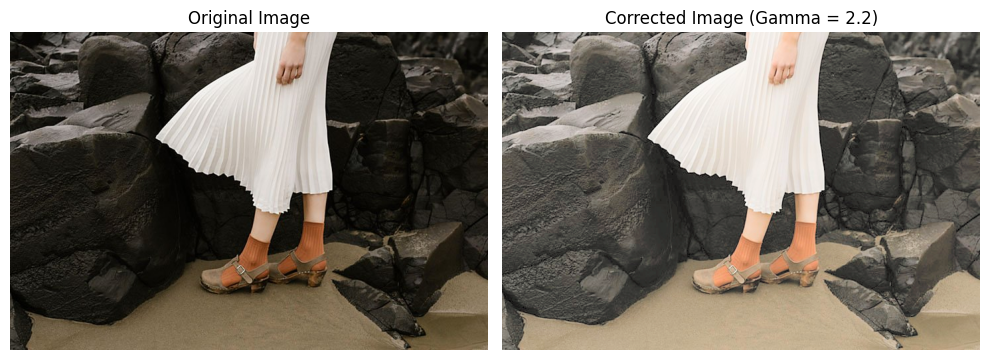

True

In [94]:
# Load an image
input_image_path = r"D:\work\UoM\sem 5\Machine Vision\Assi 1\highlights_and_shadows.jpg"
input_image = cv2.imread(input_image_path)

# Convert to L*a*b* color space
lab_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2Lab)

# Extract L* channel
l_channel = lab_image[:,:,0]

# Specify the gamma value
gamma = 2.2

# Apply gamma correction
l_corrected = np.power(l_channel / 255.0, 1.0 / gamma) * 255.0
l_corrected = np.clip(l_corrected, 0, 255).astype(np.uint8)

# Replace the original L* channel with the corrected one
lab_image[:,:,0] = l_corrected

# Convert back to the BGR color space
output_image = cv2.cvtColor(lab_image, cv2.COLOR_Lab2BGR)

# Display the original and corrected images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title(f"Corrected Image (Gamma = {gamma})")
plt.axis("off")

plt.tight_layout()
plt.show()

cv2.imwrite("output_image.jpg", output_image)


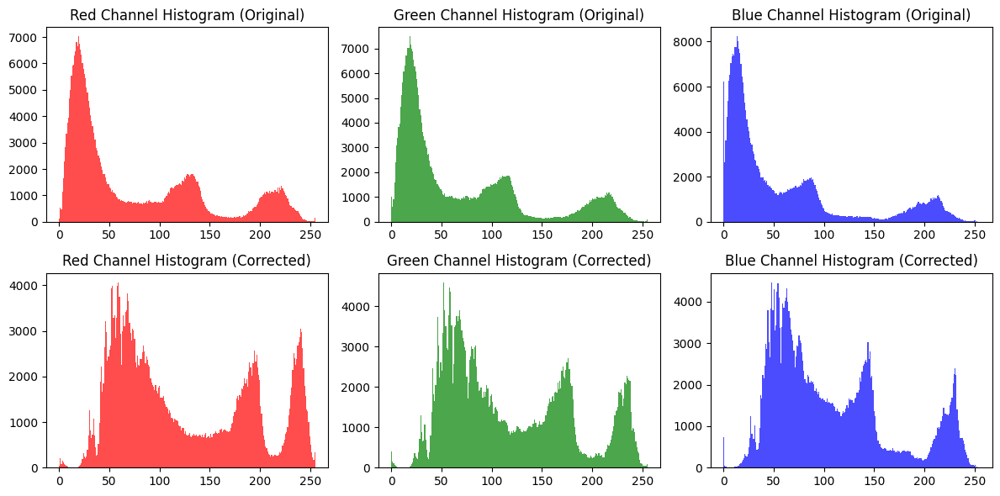

In [96]:
# Load the original color image
original_image = cv2.imread(r"D:\work\UoM\sem 5\Machine Vision\Assi 1\highlights_and_shadows.jpg")

# Load the corrected image
corrected_image = cv2.imread(r"D:\work\UoM\sem 5\Machine Vision\Assi 1\output_image.jpg")

# Convert images to RGB color space
original_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
corrected_rgb = cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB)

# Separate color channels
original_red = original_rgb[:, :, 0]
original_green = original_rgb[:, :, 1]
original_blue = original_rgb[:, :, 2]

corrected_red = corrected_rgb[:, :, 0]
corrected_green = corrected_rgb[:, :, 1]
corrected_blue = corrected_rgb[:, :, 2]

# Plot histograms for each channel
plt.figure(figsize=(12, 6))

plt.subplot(2, 3, 1)
plt.hist(original_red.ravel(), bins=256, color='red', alpha=0.7)
plt.title('Red Channel Histogram (Original)')

plt.subplot(2, 3, 2)
plt.hist(original_green.ravel(), bins=256, color='green', alpha=0.7)
plt.title('Green Channel Histogram (Original)')

plt.subplot(2, 3, 3)
plt.hist(original_blue.ravel(), bins=256, color='blue', alpha=0.7)
plt.title('Blue Channel Histogram (Original)')

plt.subplot(2, 3, 4)
plt.hist(corrected_red.ravel(), bins=256, color='red', alpha=0.7)
plt.title('Red Channel Histogram (Corrected)')

plt.subplot(2, 3, 5)
plt.hist(corrected_green.ravel(), bins=256, color='green', alpha=0.7)
plt.title('Green Channel Histogram (Corrected)')

plt.subplot(2, 3, 6)
plt.hist(corrected_blue.ravel(), bins=256, color='blue', alpha=0.7)
plt.title('Blue Channel Histogram (Corrected)')

plt.tight_layout()
plt.show()


# Question 4

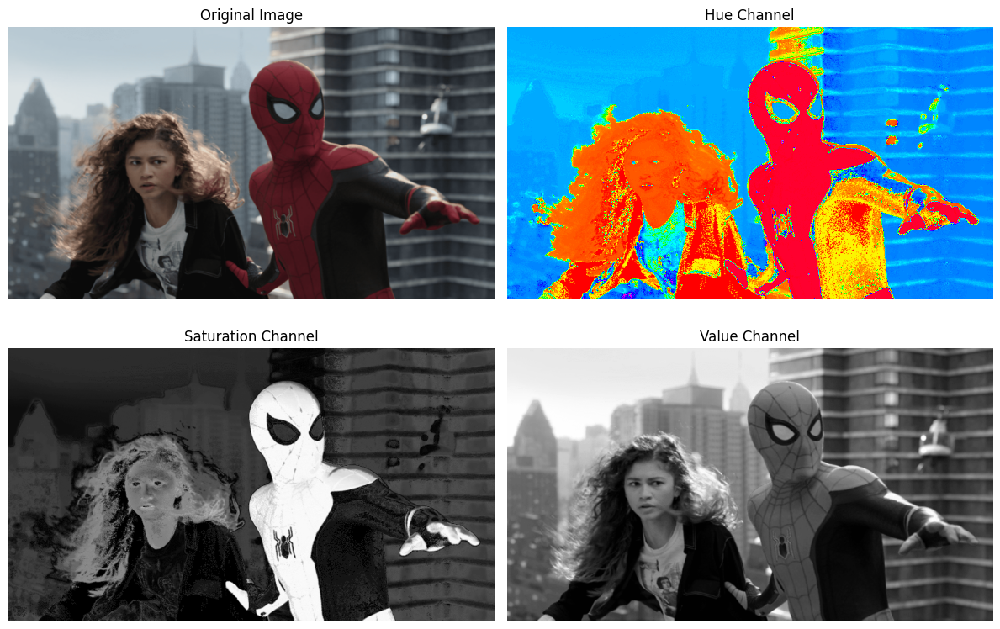

In [88]:
# Read the input image
image_path = r"D:\work\UoM\sem 5\Machine Vision\Assi 1\spider.png"
original_image = cv.imread(image_path, cv.IMREAD_COLOR)

# Convert the image to the HSV color space
hsv_image = cv.cvtColor(original_image, cv.COLOR_BGR2HSV)

# Split the HSV image into its three channels
hue_channel = hsv_image[:, :, 0]
saturation_channel = hsv_image[:, :, 1]
value_channel = hsv_image[:, :, 2]

# Display the original image along with its HSV channels
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(hue_channel, cmap="hsv")
plt.title("Hue Channel")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(saturation_channel, cmap="gray")
plt.title("Saturation Channel")
plt.axis("off") 

plt.subplot(2, 2, 4)
plt.imshow(value_channel, cmap="gray")
plt.title("Value Channel")
plt.axis("off")

plt.tight_layout()
plt.show()

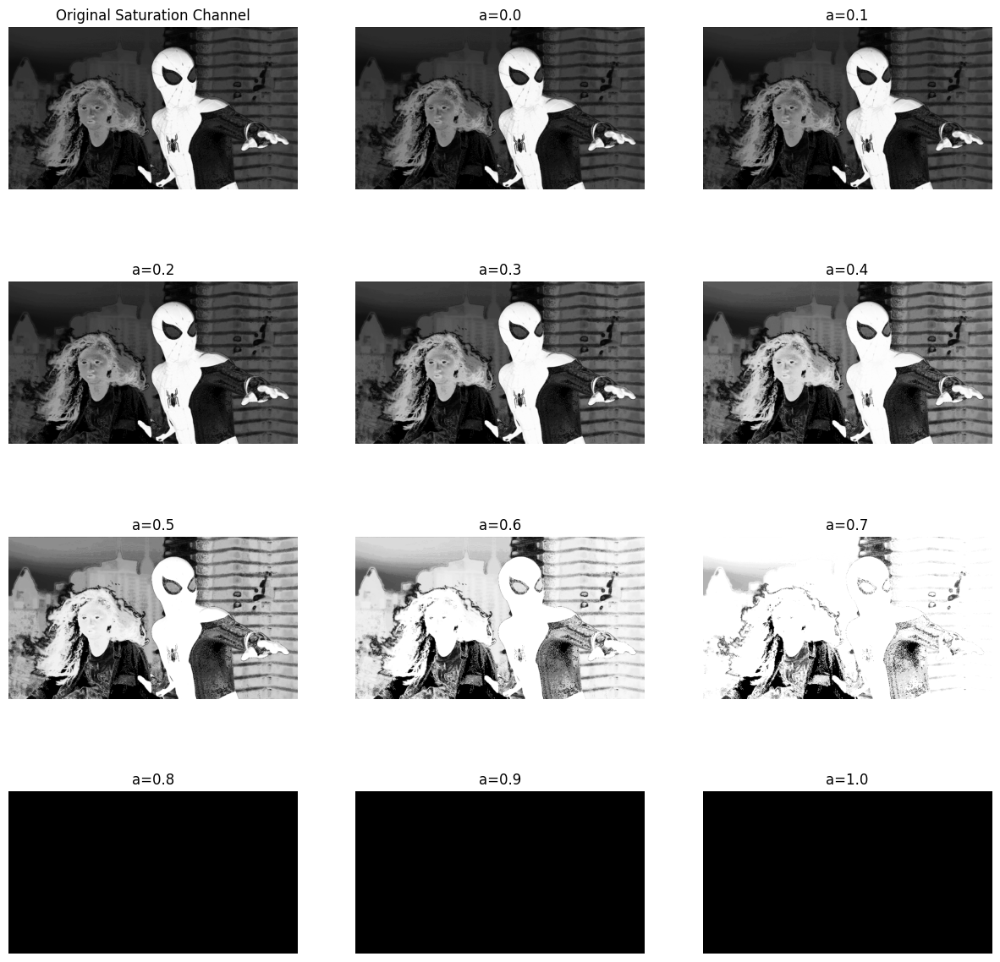

In [90]:
def apply_intensity_transformation(pixel_value, a):
    return min((pixel_value + a * 128 * np.exp(-((pixel_value - 128) ** 2) / (2 * (70 ** 2)))), 255)

# Read the image
image_path = r"D:\work\UoM\sem 5\Machine Vision\Assi 1\spider.png"
original_image = cv.imread(image_path, cv.IMREAD_COLOR)

# Convert to HSV color space
hsv_image = cv.cvtColor(original_image, cv.COLOR_BGR2HSV)

# Extract the saturation channel
saturation_channel = hsv_image[:, :, 1]

# Display the original saturation channel
plt.figure(figsize=(15, 15))
plt.subplot(4, 3, 1)
plt.title('Original Saturation Channel')
plt.imshow(saturation_channel, cmap='gray')
plt.axis('off')

# Define the parameter 'a'
for a_value in np.arange(0.0, 1.1, 0.1):

    # Apply the intensity transformation to the saturation channel
    transformed_saturation = np.vectorize(apply_intensity_transformation)(saturation_channel, a_value)

    # Replace the saturation channel with the transformed saturation channel
    hsv_image[:, :, 1] = transformed_saturation

    # Display the transformed saturation channel
    plt.subplot(4, 3, int(a_value * 10) + 2)
    plt.title(f'a={round(a_value, 1)}')
    plt.imshow(hsv_image[:, :, 1], cmap='gray')
    plt.axis('off')

plt.show()


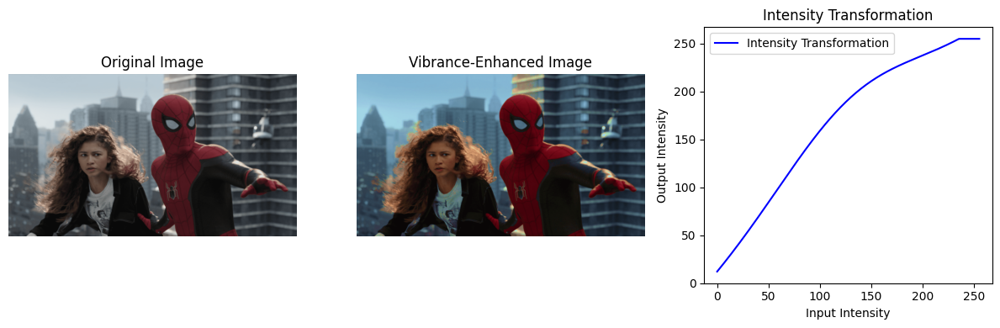

In [91]:

# (a) Load the image and convert it to HSV color space
img = cv2.imread("spider.png")
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Split the image into hue, saturation, and value planes
hue, saturation, value = cv2.split(hsv)

# (b) Define the intensity transformation function for saturation channel
def vibrance_enhancement(x, a=0.4, sigma=70):
    return np.minimum(x + a * 128 * np.exp(-(x - 128)**2 / (2 * sigma**2)), 255)

# Apply the intensity transformation only to the saturation plane
a = 0.5  # Adjust this value for visual pleasing output
enhanced_saturation = vibrance_enhancement(saturation, a=a).astype(np.uint8)

# (c) Adjust 'a' to get a visually pleasing output
# You can adjust 'a' manually to achieve the desired vibrance enhancement.

# (d) Recombine the three planes
vibrance_hsv = cv2.merge([hue, enhanced_saturation, value])

# Convert the image back to BGR color space
vibrance_img = cv2.cvtColor(vibrance_hsv, cv2.COLOR_HSV2BGR)

# (e) Display the original image, vibrance-enhanced image, and the intensity transformation
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Original image
axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

# Vibrance-enhanced image
axes[1].imshow(cv2.cvtColor(vibrance_img, cv2.COLOR_BGR2RGB))
axes[1].set_title('Vibrance-Enhanced Image')
axes[1].axis('off')

# Intensity transformation
x = np.arange(256)
transformation = vibrance_enhancement(x, a=a)
axes[2].plot(x, transformation, color='b', label='Intensity Transformation')
axes[2].set_title('Intensity Transformation')
axes[2].set_xlabel('Input Intensity')
axes[2].set_ylabel('Output Intensity')
axes[2].legend()

plt.tight_layout()
plt.show()


# Question 5

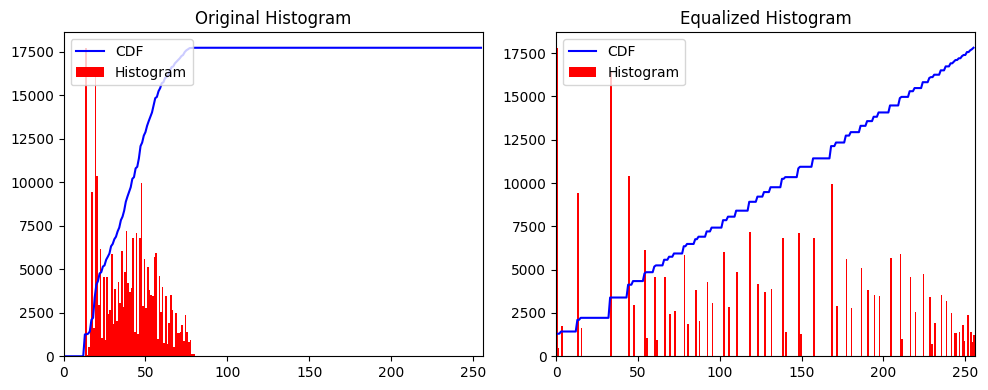

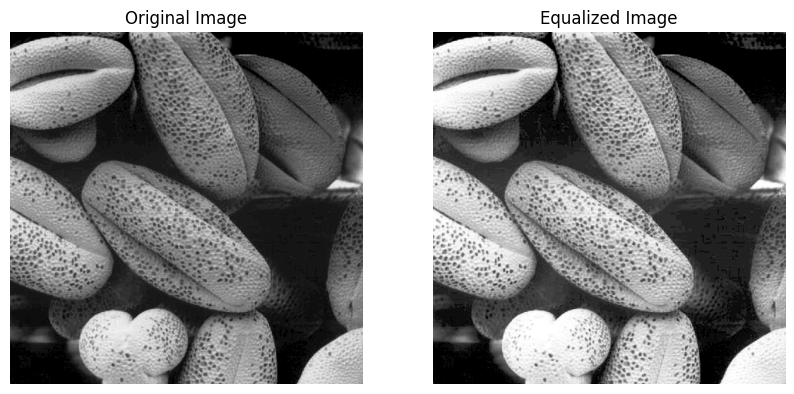

In [30]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def histogram_equalization(image_path):
    # Load the grayscale image
    img = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

    # Compute and plot the histogram of the original image
    hist, bins = np.histogram(img.ravel(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()

    plt.figure(figsize=(10, 4))
    plt.subplot(121)
    plt.plot(cdf_normalized, color='b')
    plt.hist(img.flatten(), 256, [0, 256], color='r')
    plt.xlim([0, 256])
    plt.legend(('CDF', 'Histogram'), loc='upper left')
    plt.title('Original Histogram')

    # Apply histogram equalization
    equ = cv.equalizeHist(img)

    # Compute and plot the histogram of the equalized image
    hist, bins = np.histogram(equ.ravel(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()

    plt.subplot(122)
    plt.plot(cdf_normalized, color='b')
    plt.hist(equ.flatten(), 256, [0, 256], color='r')
    plt.xlim([0, 256])
    plt.legend(('CDF', 'Histogram'), loc='upper left')
    plt.title('Equalized Histogram')

    plt.tight_layout()

    # Show the original and equalized images
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(122)
    plt.imshow(equ, cmap='gray')
    plt.title('Equalized Image')
    plt.axis('off')

    plt.show()

# Call the function with the image path
histogram_equalization('shells.tif')


# Question 6

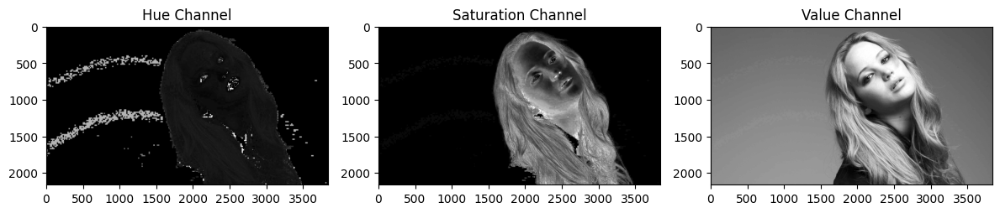

In [21]:
#(a)
import cv2
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread("jeniffer.jpg")

# Convert the image to the HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Split the image into Hue, Saturation, and Value channels
hue, saturation, value = cv2.split(hsv_image)

# Display the Hue, Saturation, and Value channels in grayscale
plt.figure(figsize=(12, 4))

plt.subplot(131)
plt.imshow(hue, cmap='gray')
plt.title('Hue Channel')

plt.subplot(132)
plt.imshow(saturation, cmap='gray')
plt.title('Saturation Channel')

plt.subplot(133)
plt.imshow(value, cmap='gray')
plt.title('Value Channel')

plt.tight_layout()
plt.show()


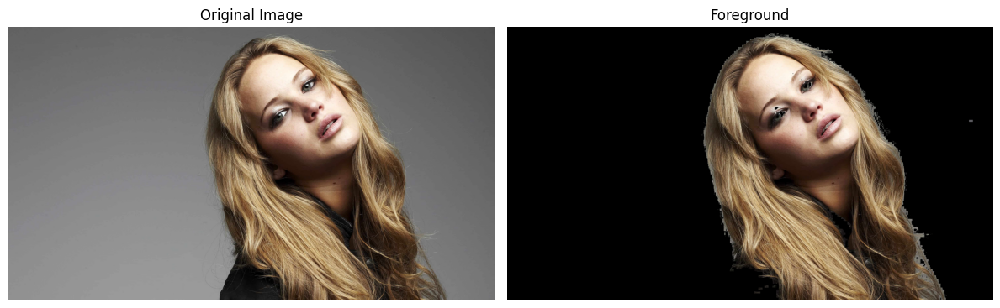

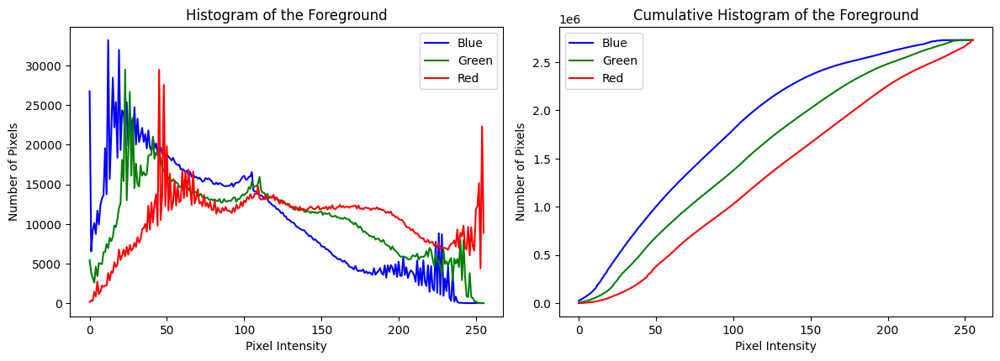

In [75]:
# Read image
image_path = r"D:\work\UoM\sem 5\Machine Vision\Assi 1\jeniffer.jpg"
img_orig = cv.imread(image_path, cv.IMREAD_COLOR)

# Convert the image into 3 channels
hsv_img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)

# Split the image into 3 channels
hue_channel = hsv_img_orig[:, :, 0]
saturation_channel = hsv_img_orig[:, :, 1]
value_channel = hsv_img_orig[:, :, 2]

# Threshold the saturation channel to extract the foreground mask
threshold_value = 11
_, foreground_mask = cv.threshold(saturation_channel, threshold_value, 255, cv.THRESH_BINARY)

# Obtain the foreground using cv.bitwise_and,compute the histogram and display
foreground = cv.bitwise_and(img_orig, img_orig, mask=foreground_mask)

# Convert foreground to grayscale for histogram computation
# foreground = cv.cvtColor(foreground, cv.COLOR_BGR2GRAY)

# Compute the histogram of the foreground
foreground_hist_blue = cv.calcHist([foreground], [0], foreground_mask, [256], [0, 256])
foreground_hist_green = cv.calcHist([foreground], [1], foreground_mask, [256], [0, 256])
foreground_hist_red = cv.calcHist([foreground], [2], foreground_mask, [256], [0, 256])

# Obtain the cumulative sum of the histogram
cumulative_hist_blue = np.cumsum(foreground_hist_blue)
cumulative_hist_green = np.cumsum(foreground_hist_green)
cumulative_hist_red = np.cumsum(foreground_hist_red)

# Display only the foreground
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_orig, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.title("Foreground")
plt.axis("off")

plt.tight_layout()
plt.show()

# Display the histogram of the foreground and the cumulative histogram
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(foreground_hist_blue, color="blue")
plt.plot(foreground_hist_green, color="green")
plt.plot(foreground_hist_red, color="red")
plt.title("Histogram of the Foreground")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.legend(["Blue", "Green", "Red"])

plt.subplot(2, 2, 2)
plt.plot(cumulative_hist_blue, color="blue")
plt.plot(cumulative_hist_green, color="green")
plt.plot(cumulative_hist_red, color="red")
plt.title("Cumulative Histogram of the Foreground")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.legend(["Blue", "Green", "Red"])

plt.tight_layout()
plt.show()


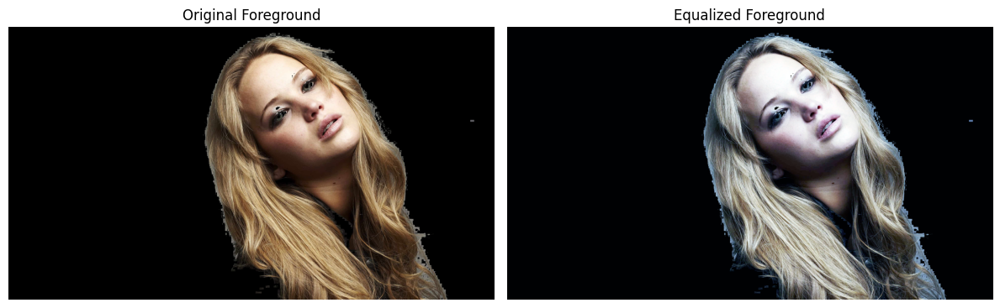

In [79]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = r"D:\work\UoM\sem 5\Machine Vision\Assi 1\jeniffer.jpg"
original_image = cv.imread(image_path, cv.IMREAD_COLOR)

# Convert to HSV color space
hsv_image = cv.cvtColor(original_image, cv.COLOR_BGR2HSV)

# Extract saturation channel and create a foreground mask
threshold_value = 11
_, foreground_mask = cv.threshold(hsv_image[:, :, 1], threshold_value, 255, cv.THRESH_BINARY)

# Apply the mask to get the foreground
foreground = cv.bitwise_and(original_image, original_image, mask=foreground_mask)

# Calculate histograms
hist_blue = cv.calcHist([foreground], [0], foreground_mask, [256], [0, 256])
hist_green = cv.calcHist([foreground], [1], foreground_mask, [256], [0, 256])
hist_red = cv.calcHist([foreground], [2], foreground_mask, [256], [0, 256])

# Calculate cumulative histograms
cumulative_hist_blue = np.cumsum(hist_blue)
cumulative_hist_green = np.cumsum(hist_green)
cumulative_hist_red = np.cumsum(hist_red)

# Histogram equalization
equalized_foreground = np.zeros(original_image.shape, dtype=np.uint8)
for i in range(256):
    equalized_foreground[(foreground[:, :, 0] == i), 0] = np.round(cumulative_hist_blue[i] * 255 / cumulative_hist_blue[-1]).astype(np.uint8)
    equalized_foreground[(foreground[:, :, 1] == i), 1] = np.round(cumulative_hist_green[i] * 255 / cumulative_hist_green[-1]).astype(np.uint8)
    equalized_foreground[(foreground[:, :, 2] == i), 2] = np.round(cumulative_hist_red[i] * 255 / cumulative_hist_red[-1]).astype(np.uint8)

# Display the images
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.title("Original Foreground")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(equalized_foreground, cv.COLOR_BGR2RGB))
plt.title("Equalized Foreground")
plt.axis("off")

plt.tight_layout()
plt.show()


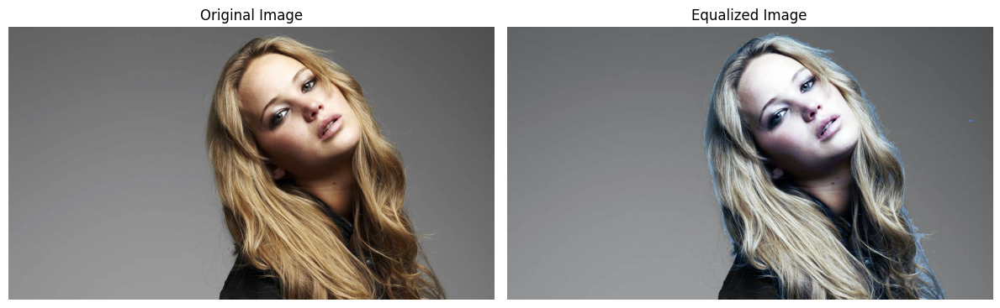

In [82]:
# Load the image
image_path = r"D:\work\UoM\sem 5\Machine Vision\Assi 1\jeniffer.jpg"
original_image = cv.imread(image_path, cv.IMREAD_COLOR)

# Convert to HSV color space
hsv_image = cv.cvtColor(original_image, cv.COLOR_BGR2HSV)

# Split the image into 3 channels
hue_channel = hsv_image[:, :, 0]
saturation_channel = hsv_image[:, :, 1]
value_channel = hsv_image[:, :, 2]

# Treshold the saturation channel to extract the foreground mas
threshold = 11
_, foreground_mask = cv.threshold(saturation_channel, threshold, 255, cv.THRESH_BINARY)

# Obtain the foreground using cv.bitwise_and,compute the histogram and display
foreground = cv.bitwise_and(original_image, original_image, mask=foreground_mask)

# Convert foreground to grayscale for histogram computation
# foreground = cv.cvtColor(foreground, cv.COLOR_BGR2GRAY)

# Compute the histogram of the foreground
foreground_hist_blue = cv.calcHist([foreground], [0], foreground_mask, [256], [0, 256])
foreground_hist_green = cv.calcHist([foreground], [1], foreground_mask, [256], [0, 256])
foreground_hist_red = cv.calcHist([foreground], [2], foreground_mask, [256], [0, 256])

# Obtain the cumulative sum of the histogram
cumulative_hist_blue = np.cumsum(foreground_hist_blue)
cumulative_hist_green = np.cumsum(foreground_hist_green)
cumulative_hist_red = np.cumsum(foreground_hist_red)

# Histogram equalization = Cumulative probability * 255
transformed_hist_blue = np.round(cumulative_hist_blue * 255 / cumulative_hist_blue[-1]).astype(np.uint8)
transformed_hist_green = np.round(cumulative_hist_green * 255 / cumulative_hist_green[-1]).astype(np.uint8)
transformed_hist_red = np.round(cumulative_hist_red * 255 / cumulative_hist_red[-1]).astype(np.uint8)

# Create a new image with the new pixel intensity
eqz_foreground = np.zeros(original_image.shape, dtype=np.uint8)
for i in range(256):
    eqz_foreground[(foreground[:, :, 0] == i), 0] = transformed_hist_blue[i]
    eqz_foreground[(foreground[:, :, 1] == i), 1] = transformed_hist_green[i]
    eqz_foreground[(foreground[:, :, 2] == i), 2] = transformed_hist_red[i]

# Extract the background from the original image
background = cv.bitwise_and(original_image, original_image, mask=cv.bitwise_not(foreground_mask))

# Combine the equalized foreground and the background
eqz_img = cv.add(eqz_foreground, background)

# Display the original image and the equalized image
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(eqz_img, cv.COLOR_BGR2RGB))
plt.title("Equalized Image")
plt.axis("off")

plt.tight_layout()
plt.show()




# Question 7

## (a)

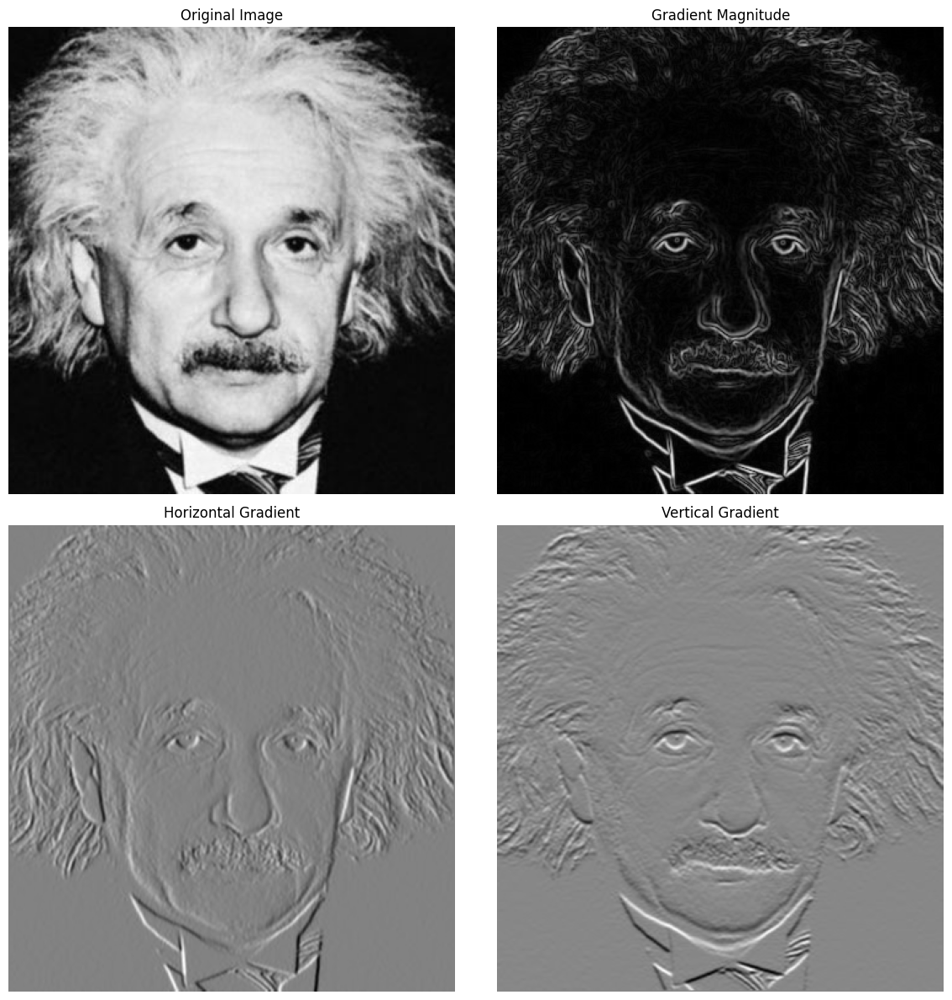

(None, None)

In [71]:
# Read the grayscale image
original_image = cv.imread("einstein.png", cv.IMREAD_GRAYSCALE)

# Apply Sobel filters for horizontal and vertical gradients
sobel_x_filter = cv.filter2D(original_image, cv.CV_64F, np.array([[-1,0,1], [-2,0,2], [-1,0,1]]))
sobel_y_filter = cv.filter2D(original_image, cv.CV_64F, np.array([[-1,-2,-1], [0,0,0], [1,2,1]]))

# Calculate gradient magnitude
gradient_magnitude = np.sqrt(sobel_x_filter**2 + sobel_y_filter**2)

# Display images: original, gradient magnitude, horizontal and vertical gradients
plt.figure(figsize=(12, 12))
plt.subplot(2,2,1), plt.imshow(original_image, cmap='gray'), plt.title('Original Image'), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(gradient_magnitude, cmap='gray'), plt.title('Gradient Magnitude'), plt.axis("off")
plt.subplot(2,2,3), plt.imshow(sobel_x_filter, cmap='gray'), plt.title('Horizontal Gradient'), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(sobel_y_filter, cmap='gray'), plt.title('Vertical Gradient'), plt.axis('off')
plt.tight_layout(), plt.show()

## (b)

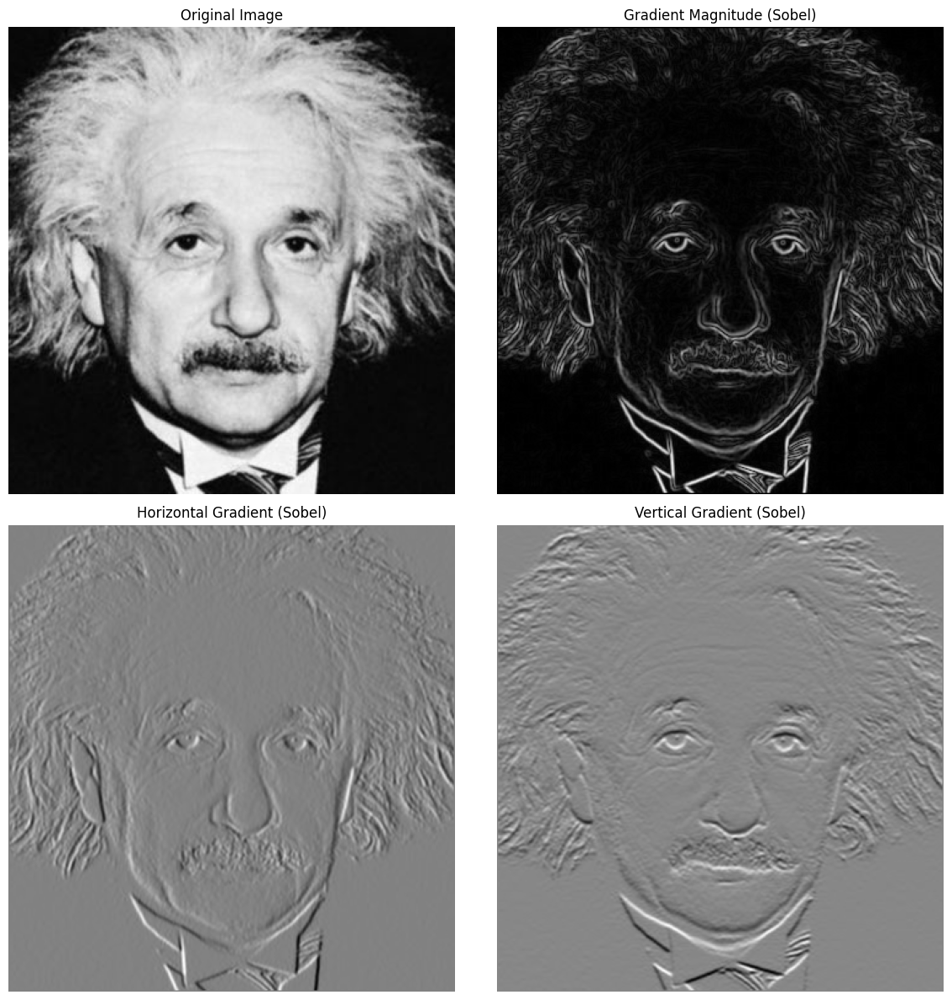

In [72]:
# Read the image
image_path = r"D:\work\UoM\sem 5\Machine Vision\Assi 1\einstein.png"
gray_image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

# Define Sobel filters
sobel_x_filter = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype='float')
sobel_y_filter = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype='float')

# Apply Sobel filters to the image in the x and y directions iteratively
horizontal_gradient = np.zeros_like(gray_image, dtype='float')
vertical_gradient = np.zeros_like(gray_image, dtype='float')

#Custom code
for i in range(1, gray_image.shape[0]-1):
    for j in range(1, gray_image.shape[1]-1):
        horizontal_gradient[i, j] = np.sum(np.multiply(gray_image[i-1:i+2, j-1:j+2], sobel_x_filter))
        vertical_gradient[i, j] = np.sum(np.multiply(gray_image[i-1:i+2, j-1:j+2], sobel_y_filter))

# Compute the gradient magnitude
gradient_magnitude = np.sqrt(horizontal_gradient**2 + vertical_gradient**2)

# Display the original image and gradient magnitude
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Gradient Magnitude (Sobel)')
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(horizontal_gradient, cmap='gray')
plt.title('Horizontal Gradient (Sobel)')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(vertical_gradient, cmap='gray')
plt.title('Vertical Gradient (Sobel)')
plt.axis('off')

plt.tight_layout()
plt.show()


# Question 8

Zoomed image size (Nearest Neighbor):  (1080, 1920, 3)
Zoomed image size (Bilinear):  (1080, 1920, 3)


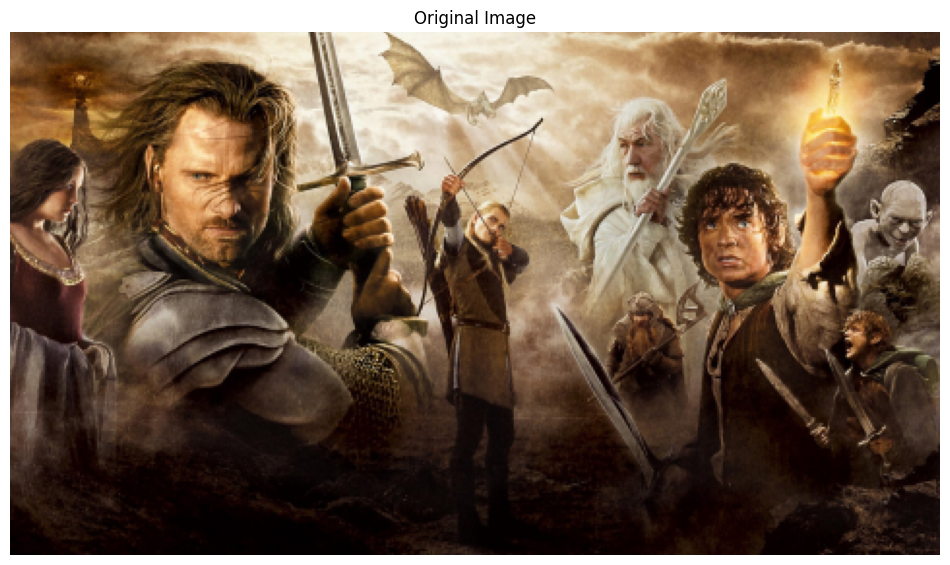

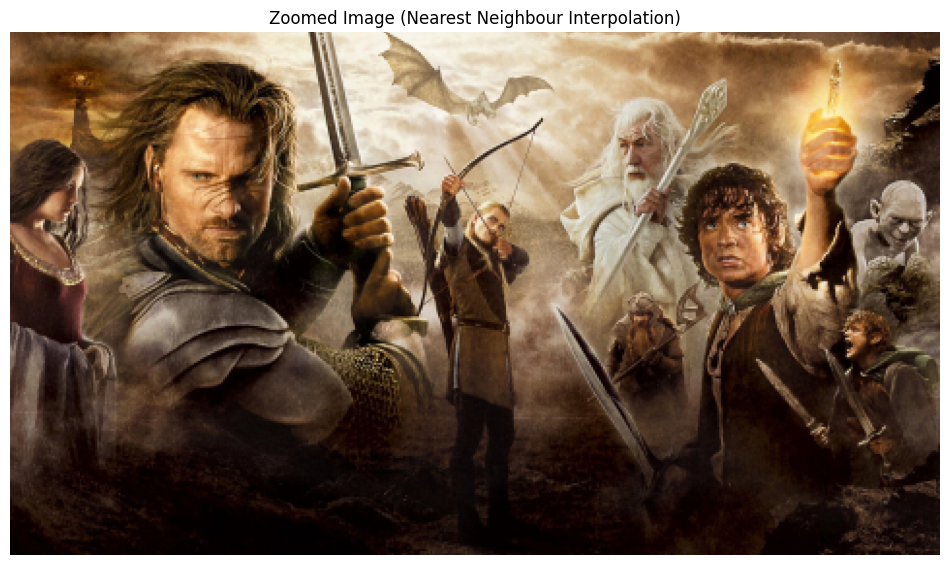

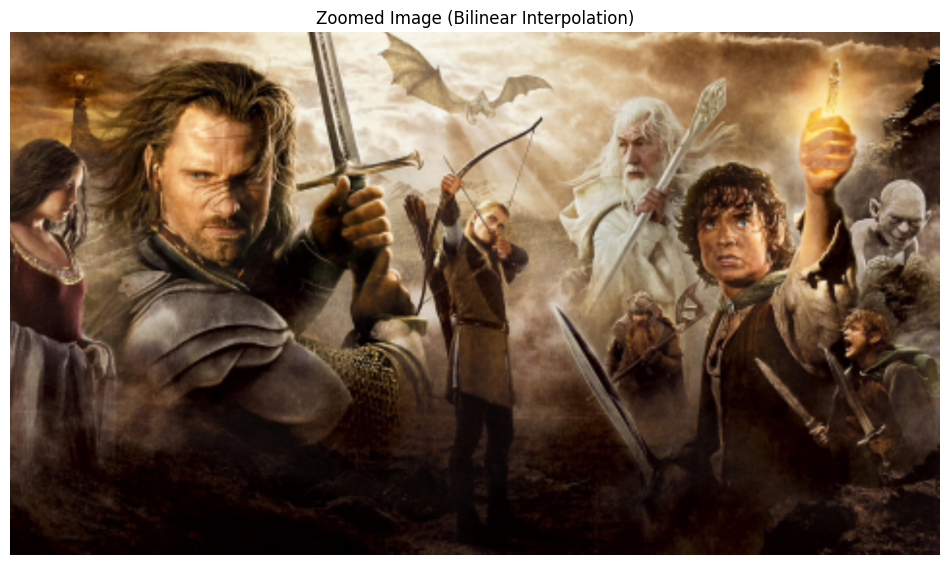

SSD (Nearest Neighbour Interpolation):  93.85294945987654
SSD (Bilinear Interpolation):  117.721953125


In [59]:
# Function to zoom image using nearest neighbour interpolation
def zoom_nearest_neighbour(img, new_img, new_img_height, new_img_width, zoom_factor):
    for i in range(new_img_height):
        for j in range(new_img_width):
            new_img[i, j] = img[int(i / zoom_factor), int(j / zoom_factor)]
    return new_img

# Function to zoom image using bilinear interpolation
def zoom_bilinear_interpolation(img, new_img, new_img_height, new_img_width, zoom_factor):
    for i in range(new_img_height):
        for j in range(new_img_width):
            x = int(i / zoom_factor)
            y = int(j / zoom_factor)
            a = i / zoom_factor - x
            b = j / zoom_factor - y
            if x == img.shape[0] - 1 or y == img.shape[1] - 1:
                new_img[i, j] = img[x, y]
            else:
                new_img[i, j] = (
                    (1 - a) * (1 - b) * img[x, y]
                    + (1 - a) * b * img[x, y + 1]
                    + a * (1 - b) * img[x + 1, y]
                    + a * b * img[x + 1, y + 1]
                )
    return new_img

# Define the file paths
small_image_path = r"C:\Users\acer\Downloads\zooming\zooming\im01small.png"
original_image_path = r"C:\Users\acer\Downloads\zooming\zooming\im01.png"

# Read the images
img = cv.imread(small_image_path, cv.IMREAD_COLOR)
original_image = cv.imread(original_image_path, cv.IMREAD_COLOR)

# Define the zoom factor
zoom_factor = 4

# Calculate the new image size
new_img_height = img.shape[0] * zoom_factor
new_img_width = img.shape[1] * zoom_factor

# Create new images with the new size
new_img_nni = np.zeros((new_img_height, new_img_width, 3), dtype=np.uint8)
new_img_bli = np.zeros((new_img_height, new_img_width, 3), dtype=np.uint8)

# Zoom the image using nearest neighbour interpolation
new_image_nni = zoom_nearest_neighbour(img, new_img_nni, new_img_height, new_img_width, zoom_factor)

# Zoom the image using bilinear interpolation
new_image_bli = zoom_bilinear_interpolation(img, new_img_bli, new_img_height, new_img_width, zoom_factor)

# Print details of the original and zoomed images
print("Zoomed image size (Nearest Neighbor): ", new_image_nni.shape)
print("Zoomed image size (Bilinear): ", new_image_bli.shape)

# Display the original and zoomed images
plt.figure(figsize=(12, 12))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(cv.cvtColor(new_image_nni, cv.COLOR_BGR2RGB))
plt.title("Zoomed Image (Nearest Neighbour Interpolation)")
plt.axis("off")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(cv.cvtColor(new_image_bli, cv.COLOR_BGR2RGB))
plt.title("Zoomed Image (Bilinear Interpolation)")
plt.axis("off")
plt.show()

# Compute the normalized sum of squared difference (SSD) between the original and zoomed images
ssd_nni = np.sum((original_image - new_image_nni) ** 2) / (original_image.shape[0] * original_image.shape[1])
ssd_bli = np.sum((original_image - new_image_bli) ** 2) / (original_image.shape[0] * original_image.shape[1])

print("SSD (Nearest Neighbour Interpolation): ", ssd_nni)
print("SSD (Bilinear Interpolation): ", ssd_bli)


# Question 9

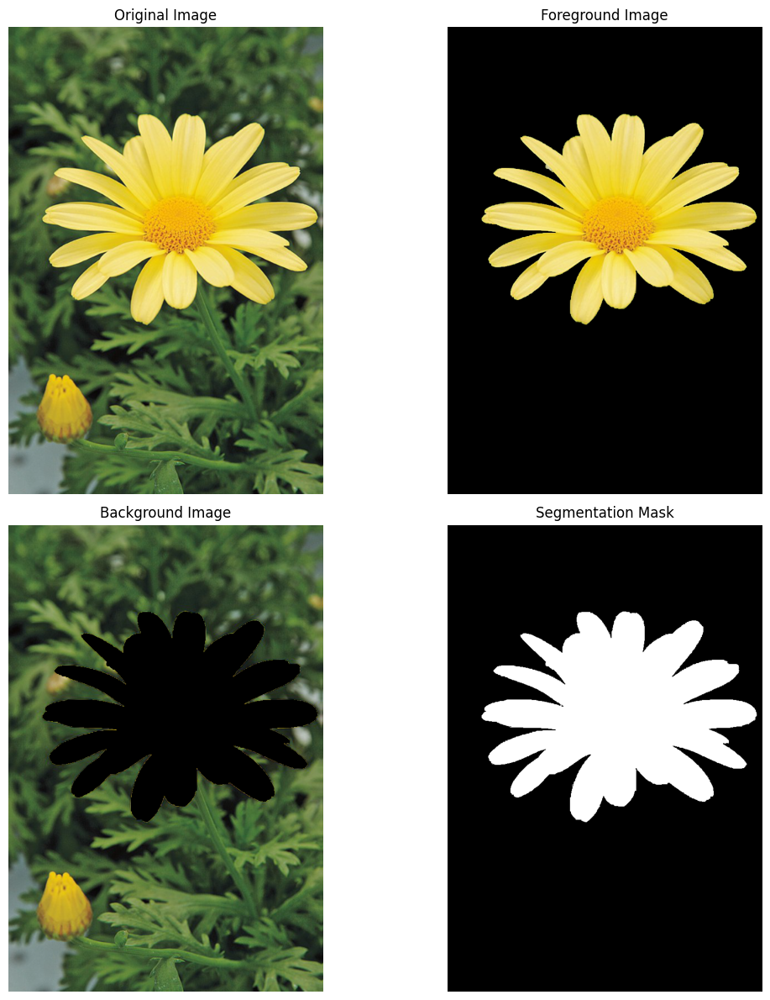

In [66]:
# Read the image
img = cv.imread(r"D:\work\UoM\sem 5\Machine Vision\Assi 1\flower.png", cv.IMREAD_COLOR)

# Use grabCut to segment the image and Show the final segmentation mask, foreground image, and background image
mask = np.zeros(img.shape[:2], np.uint8)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)
rect = (50, 100, 610, 580)

cv.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)

mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

# Segment the foreground and background
img_fg = img * mask2[:, :, np.newaxis]
img_bg = img * (1 - mask2[:, :, np.newaxis])

# Display the original image and the segmented images
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv.cvtColor(img_fg, cv.COLOR_BGR2RGB))
plt.title('Foreground Image')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv.cvtColor(img_bg, cv.COLOR_BGR2RGB))
plt.title('Background Image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(mask2, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.tight_layout()
plt.show()


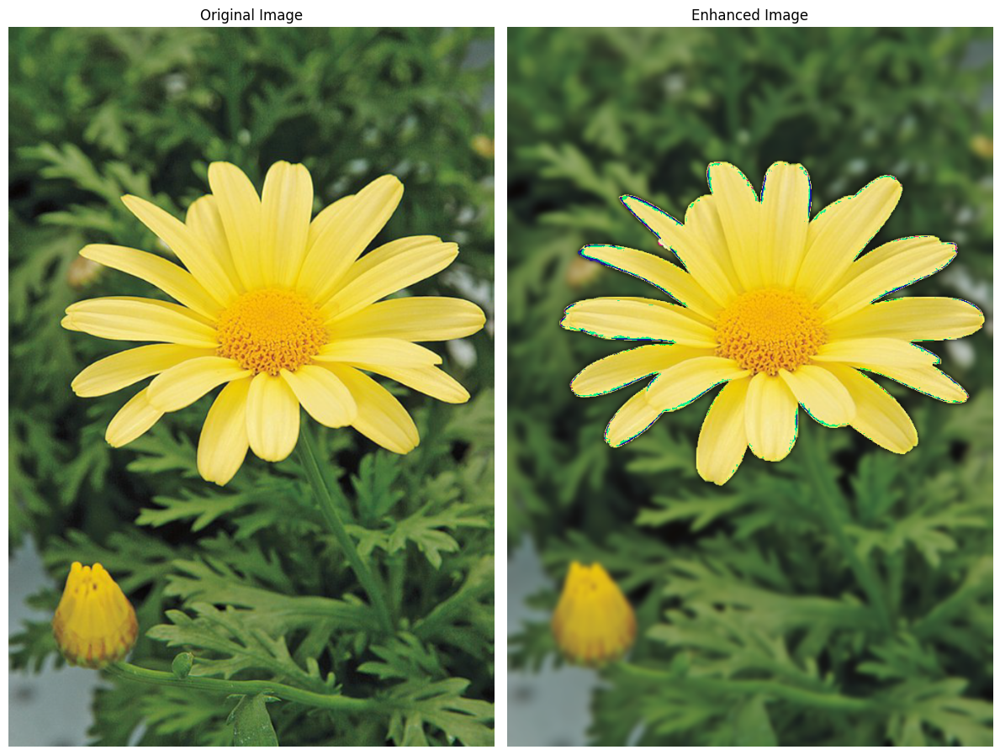

In [69]:
# Initialize segmentation mask, background, and foreground models, and define the initial rectangle
segmentation_mask = np.zeros(img.shape[:2], np.uint8)
background_model = np.zeros((1, 65), np.float64)
foreground_model = np.zeros((1, 65), np.float64)
initial_rectangle = (50, 100, 610, 580)

# Apply GrabCut algorithm to segment the image based on the initial rectangle
cv.grabCut(img, segmentation_mask, initial_rectangle, background_model, foreground_model, 5, cv.GC_INIT_WITH_RECT)

# Create a binary mask to separate foreground and background
binary_mask = np.where((segmentation_mask == 2) | (segmentation_mask == 0), 0, 1).astype('uint8')

# Generate foreground and background images based on the binary mask
foreground_image = img * binary_mask[:, :, np.newaxis]
background_image = img - foreground_image

# Apply Gaussian blur to the background image
blurred_background = cv.GaussianBlur(background_image, (21, 21), 0)

# Combine the foreground and blurred background to enhance the image
enhanced_image = foreground_image + blurred_background

# Display the original and enhanced images
plt.figure(figsize=(12, 12))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(enhanced_image, cv.COLOR_BGR2RGB))
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()
